# Importation library

# Hyperparamètres
# Diffusion hyperparamètres


In [1]:
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import HTML
from diffusion_utilities import ResidualConvBlock, UnetUp, UnetDown, EmbedFC, plot_sample
import os


In [2]:
timesteps = 500
beta1 = 1e-4
beta2 = 0.02

# Réseau hyperparamètres
device = torch.device("cuda:0" if torch.cuda.is_available() else torch.device('cpu'))
n_feat = 64       # Dimension des features cachées
n_cfeat = 5       # Taille du vecteur de contexte
height = 16       # Image 16x16


# Construction du planning de bruit DDPM avec un schedule linéaire
b_t = beta1 + ((beta2 - beta1) * torch.linspace(0, 1, timesteps + 1, device=device))
a_t = 1 - b_t
ab_t = torch.cumsum(a_t.log(), dim=0).exp()
ab_t[0] = 1

#L'Architecture U-Net pour la prédiction du bruit
# (Cette partie reste inchangée, il s'agit de comprendre le fonctionnement du U-Net)

In [3]:

class ContextUnet(nn.Module):
    def __init__(self, in_channels, n_feat=256, n_cfeat=10, height=28):  # n_cfeat : features du contexte
        super(ContextUnet, self).__init__()
        self.in_channels = in_channels
        self.n_feat = n_feat
        self.n_cfeat = n_cfeat
        self.h = height  # h == w, doit être divisible par 4 (ex: 28,24,20,16...)

        # Couche de convolution initiale
        self.init_conv = ResidualConvBlock(in_channels, n_feat, is_res=True)

        # Chemin de down-sampling du U-Net avec deux niveaux
        self.down1 = UnetDown(n_feat, n_feat)
        self.down2 = UnetDown(n_feat, 2 * n_feat)

        # Transformation des feature maps en vecteur
        self.to_vec = nn.Sequential(nn.AvgPool2d(4), nn.GELU())

        # Embedding du temps et du contexte via une couche FC
        self.timeembed1 = EmbedFC(1, 2*n_feat)
        self.timeembed2 = EmbedFC(1, n_feat)
        self.contextembed1 = EmbedFC(n_cfeat, 2*n_feat)
        self.contextembed2 = EmbedFC(n_cfeat, n_feat)

        # Chemin d'up-sampling du U-Net avec trois niveaux
        self.up0 = nn.Sequential(
            nn.ConvTranspose2d(2 * n_feat, 2 * n_feat, self.h//4, self.h//4),
            nn.GroupNorm(8, 2 * n_feat),
            nn.ReLU(),
        )
        self.up1 = UnetUp(4 * n_feat, n_feat)
        self.up2 = UnetUp(2 * n_feat, n_feat)

        # Couche de sortie pour ramener au nombre de canaux d'entrée
        self.out = nn.Sequential(
            nn.Conv2d(2 * n_feat, n_feat, 3, 1, 1),
            nn.GroupNorm(8, n_feat),
            nn.ReLU(),
            nn.Conv2d(n_feat, self.in_channels, 3, 1, 1),
        )

    def forward(self, x, t, c=None):
        # x : (batch, n_feat, h, w) : image d'entrée
        # t : (batch, n_cfeat)      : temps
        # c : (batch, n_classes)    : étiquette de contexte
        x = self.init_conv(x)
        down1 = self.down1(x)
        down2 = self.down2(down1)

        hiddenvec = self.to_vec(down2)

        if c is None:
            c = torch.zeros(x.shape[0], self.n_cfeat).to(x.device)

        cemb1 = self.contextembed1(c).view(-1, self.n_feat * 2, 1, 1)
        temb1 = self.timeembed1(t).view(-1, self.n_feat * 2, 1, 1)
        cemb2 = self.contextembed2(c).view(-1, self.n_feat, 1, 1)
        temb2 = self.timeembed2(t).view(-1, self.n_feat, 1, 1)

        up1 = self.up0(hiddenvec)
        up2 = self.up1(cemb1 * up1 + temb1, down2)
        up3 = self.up2(cemb2 * up2 + temb2, down1)
        out = self.out(torch.cat((up3, x), 1))
        return out

# Construction du modèle
nn_model = ContextUnet(in_channels=3, n_feat=n_feat, n_cfeat=n_cfeat, height=height).to(device)



In [4]:
# Chargement du modèle pré-entraîné
model_path = '/content/context_model_trained.pth'
nn_model.load_state_dict(torch.load(model_path, map_location=device))
nn_model.eval()
print("Modèle pré-entraîné chargé.")

# Détermination du répertoire pour sauvegarder les visualisations à partir du modèle chargé
save_dir = os.path.dirname(model_path)
if save_dir == "":
    save_dir = "."

Modèle pré-entraîné chargé.


In [5]:
# Fonction helper : débruitage avec ajout de bruit supplémentaire
def denoise_add_noise(x, t, pred_noise, z=None):
    if z is None:
        z = torch.randn_like(x)
    noise = b_t.sqrt()[t] * z
    mean = (x - pred_noise * ((1 - a_t[t]) / (1 - ab_t[t]).sqrt())) / a_t[t].sqrt()
    return mean + noise

In [6]:
# 4. Le Processus d'Échantillonnage
@torch.no_grad()
def sample_ddpm(n_sample, save_rate=20):
    samples = torch.randn(n_sample, 3, height, height).to(device)
    intermediate = []
    for i in range(timesteps, 0, -1):
        print(f'sampling timestep {i:3d}', end='\r')
        t = torch.tensor([i / timesteps])[:, None, None, None].to(device)
        z = torch.randn_like(samples) if i > 1 else 0
        eps = nn_model(samples, t)
        samples = denoise_add_noise(samples, i, eps, z)
        if i % save_rate == 0 or i == timesteps or i < 8:
            intermediate.append(samples.detach().cpu().numpy())
    intermediate = np.stack(intermediate)
    return samples, intermediate

@torch.no_grad()
def sample_ddpm_incorrect(n_sample):
    samples = torch.randn(n_sample, 3, height, height).to(device)
    intermediate = []
    for i in range(timesteps, 0, -1):
        print(f'sampling timestep {i:3d}', end='\r')
        t = torch.tensor([i / timesteps])[:, None, None, None].to(device)
        z = 0   # Pas d'ajout de bruit
        eps = nn_model(samples, t)
        samples = denoise_add_noise(samples, i, eps, z)
        if i % 20 == 0 or i == timesteps or i < 8:
            intermediate.append(samples.detach().cpu().numpy())
    intermediate = np.stack(intermediate)
    return samples, intermediate

In [7]:
# Visualisation avec l'échantillonnage standard
plt.clf()
samples, intermediate_ddpm = sample_ddpm(32)
animation_ddpm = plot_sample(intermediate_ddpm, 32, 4, save_dir, "ani_run", None, save=False)
HTML(animation_ddpm.to_jshtml())

<Figure size 640x480 with 0 Axes>

In [ ]:



# Visualisation avec l'échantillonnage incorrect (sans bruit supplémentaire)
plt.clf()
samples, intermediate = sample_ddpm_incorrect(32)
animation = plot_sample(intermediate, 32, 4, save_dir, "ani_run", None, save=False)
HTML(animation.to_jshtml())


<Figure size 640x480 with 0 Axes>

###############################################
#  TP3-2: PROCESSUS D'ENTRAÎNEMENT ET ÉVALUATION
###############################################

In [8]:
from tqdm import tqdm
import torch
import os
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import HTML
from diffusion_utilities import ResidualConvBlock, UnetUp, UnetDown,EmbedFC, plot_sample,CustomDataset,transform

In [9]:
# Paramètres d'entraînement
batch_size = 100
n_epoch = 1
lrate = 1e-3

# Chargement du dataset et création du DataLoader
dataset = CustomDataset("/content/sprites_1788_16x16.npy", "/content/sprite_labels_nc_1788_16x16.npy", transform, null_context=False)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=1)

# Création de l'optimiseur
optim = torch.optim.Adam(nn_model.parameters(), lr=lrate)

# Fonct

sprite shape: (89400, 16, 16, 3)
labels shape: (89400, 5)


In [10]:
# Création de l'optimiseur
optim = torch.optim.Adam(nn_model.parameters(), lr=lrate)

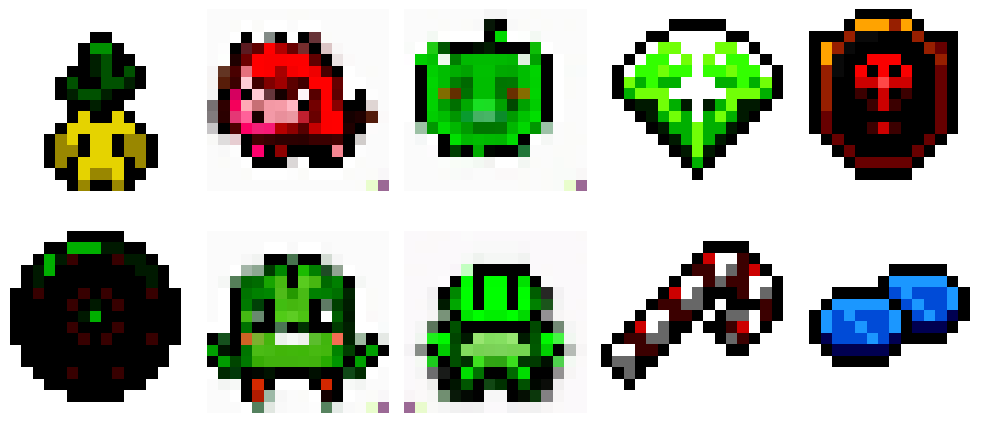

In [11]:
# Fonction d'affichage d'échantillons du dataset
def plot_sample_images(loader):
    images, _ = next(iter(loader))
    plt.figure(figsize=(10, 5))
    for i in range(10):
        plt.subplot(2, 5, i + 1)
        plt.imshow(images[i].permute(1, 2, 0).cpu().numpy())
        plt.axis("off")
    plt.tight_layout()
    plt.show()

plot_sample_images(dataloader)

# Fonction pour perturber l'image (ajout de bruit selon la formule :
# x_t = sqrt(ᾱ_t)*x0 + sqrt(1-ᾱ_t)*noise)
def perturb_input(x, t, noise):
    sqrt_ab = ab_t[t].sqrt().view(-1, 1, 1, 1)
    sqrt_one_minus_ab = (1 - ab_t[t]).sqrt().view(-1, 1, 1, 1)
    return sqrt_ab * x + sqrt_one_minus_ab * noise

In [12]:
# Boucle d'entraînement
nn_model.train()
for ep in range(n_epoch):
    print(f'Epoch {ep}')
    # Décroissance linéaire du taux d'apprentissage pour la stabilité
    optim.param_groups[0]['lr'] = lrate * (1 - ep / n_epoch)
    pbar = tqdm(dataloader, mininterval=2)
    for x, _ in pbar:
        optim.zero_grad()
        x = x.to(device)
        noise = torch.randn_like(x)
        # Choix aléatoire d'un indice de diffusion t pour chaque image
        t = torch.randint(1, timesteps + 1, (x.shape[0],)).to(device)
        # Perturbation de l'image avec bruit
        x_pert = perturb_input(x, t, noise)
        # Normalisation du temps pour l'embedding (t/timesteps)
        t_norm = (t.float() / timesteps).view(-1, 1, 1, 1)
        # Le modèle doit prédire le bruit ajouté
        pred_noise = nn_model(x_pert, t_norm)
        loss = F.mse_loss(pred_noise, noise)
        loss.backward()
        optim.step()
        pbar.set_description(f"loss: {loss.item():.4f}")

    # Sauvegarde périodique du modèle
    if ep % 4 == 0 or ep == n_epoch - 1:
        if not os.path.exists(save_dir):
            os.mkdir(save_dir)
        ckpt_path = os.path.join(save_dir, f"model_{ep}.pth")
        torch.save(nn_model.state_dict(), ckpt_path)
        print("Modèle sauvegardé à", ckpt_path)

Epoch 0


loss: 0.0577: 100%|██████████| 894/894 [00:33<00:00, 26.42it/s]


Modèle sauvegardé à /content/model_0.pth


In [13]:
# Évaluation du modèle :
# On charge par exemple le checkpoint de l'époque 0 pour évaluer l'évolution
ckpt_to_eval = os.path.join(save_dir, "/content/model_0.pth")
nn_model.load_state_dict(torch.load(ckpt_to_eval, map_location=device))
nn_model.eval()
print("Modèle chargé pour évaluation (checkpoint: model_0.pth)")


Modèle chargé pour évaluation (checkpoint: model_0.pth)


In [36]:
# Function DDIM (definition of the denoising function and sampling)
def denoise_ddim(x, t, t_prev, pred_noise):
    ab = ab_t[t]
    ab_prev = ab_t[t_prev]
    x0_pred = ab_prev.sqrt() / ab.sqrt() * (x - (1 - ab).sqrt() * pred_noise)
    dir_xt = (1 - ab_prev).sqrt() * pred_noise
    return x0_pred + dir_xt


@torch.no_grad()
def sample_ddim(n_sample, n=20):
    samples = torch.randn(n_sample, 3, height, height).to(device)
    intermediate = []
    step_size = timesteps // n
    for i in range(timesteps, 0, -step_size):
        print(f'sampling timestep {i:3d}', end='\r')
        t = torch.tensor([i / timesteps])[:, None, None, None].to(device)
        # Calculate t_prev
        t_prev = max(i - step_size, 0)  # Ensure t_prev doesn't go below 0
        t_prev_tensor = torch.tensor([t_prev / timesteps])[:, None, None, None].to(device)

        eps = nn_model(samples, t)
        samples = denoise_ddim(samples, i, t_prev, eps)  # Pass t_prev to denoise_ddim
        intermediate.append(samples.detach().cpu().numpy())
    intermediate = np.stack(intermediate)
    return samples, intermediate

In [14]:
# Échantillonnage avec DDPM
plt.clf()
samples, intermediate_ddpm = sample_ddpm(32)
animation_ddpm = plot_sample(intermediate_ddpm, 32, 4, save_dir, "ani_run", None, save=False)
HTML(animation_ddpm.to_jshtml())

<Figure size 640x480 with 0 Axes>

In [37]:
# Échantillonnage avec DDIM
plt.clf()
samples, intermediate = sample_ddim(32, n=25)
animation_ddim = plot_sample(intermediate, 32, 4, save_dir, "ani_run", None, save=False)
HTML(animation_ddim.to_jshtml())

<Figure size 640x480 with 0 Axes>